In [3]:
import sklearn 
import numpy as np
import scipy

In [4]:
from scipy.io import wavfile
from scipy.signal import resample

def load_wav(filename,samplerate=44100):
    
    # load file
    rate, data = wavfile.read(filename)

    # convert stereo to mono
    if len(data.shape) > 1:
        data = data[:,0]/2 + data[:,1]/2

    # re-interpolate samplerate    
    ratio = float(samplerate) / float(rate)
    data = resample(data, len(data) * ratio)
    
    return samplerate, data.astype(np.int16)


In [5]:
import StringIO
import base64
import struct  
import sys

from IPython.core.display import HTML
from IPython.core.display import display

def wavPlayer(data, rate):
    """ will display html 5 player for compatible browser
    The browser need to know how to play wav through html5.
    there is no autoplay to prevent file playing when the browser opens
    Adapted from SciPy.io. and
    github.com/Carreau/posts/blob/master/07-the-sound-of-hydrogen.ipynb
    """
    
    buffer = StringIO.StringIO()
    buffer.write(b'RIFF')
    buffer.write(b'\x00\x00\x00\x00')
    buffer.write(b'WAVE')

    buffer.write(b'fmt ')
    if data.ndim == 1:
        noc = 1
    else:
        noc = data.shape[1]
    bits = data.dtype.itemsize * 8
    sbytes = rate*(bits // 8)*noc
    ba = noc * (bits // 8)
    buffer.write(struct.pack('<ihHIIHH', 16, 1, noc, rate, sbytes, ba, bits))

    # data chunk
    buffer.write(b'data')
    buffer.write(struct.pack('<i', data.nbytes))

    if data.dtype.byteorder == '>' or (data.dtype.byteorder == '=' and sys.byteorder == 'big'):
        data = data.byteswap()

    buffer.write(data.tostring())
    # return buffer.getvalue()
    # Determine file size and place it in correct
    # position at start of the file.
    size = buffer.tell()
    buffer.seek(4)
    buffer.write(struct.pack('<i', size-8))
    
    val = buffer.getvalue()
    
    src = """
    <head>
    <meta http-equiv="Content-Type" content="text/html; charset=utf-8">
    <title>Simple Test</title>
    </head>
    
    <body>
    <audio controls="controls" style="width:600px" >
      <source controls src="data:audio/wav;base64,{base64}" type="audio/wav" />
      Your browser does not support the audio element.
    </audio>
    </body>
    """.format(base64=base64.encodestring(val))
   
    display(HTML(src))

In [37]:
import os
#print os.getcwd();
os.chdir('./ariad/')

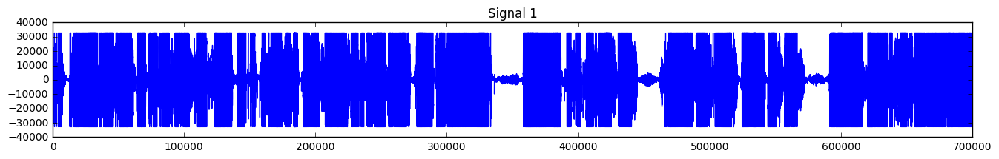

In [39]:
import matplotlib.pyplot as pl

# load
fs1,s1 = load_wav('OS1.wav')

pl.figure(figsize=(16,2))
pl.plot(s1)
pl.title('Signal 1')
pl.show()
wavPlayer(s1, fs1)

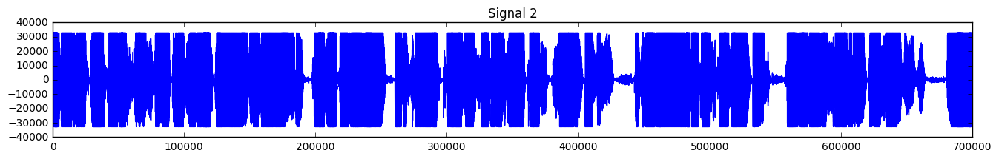

In [40]:
import matplotlib.pyplot as pl

# load
fs2,s2 = load_wav('OS2.wav')
pl.figure(figsize=(16,2))
pl.plot(s2)
pl.title('Signal 2')
pl.show()
wavPlayer(s2, fs2)

In [41]:
import numpy as np
fs = fs1
length = max([len(s1), len(s2)])

s1.resize((length,1),refcheck=False)
s2.resize((length,1),refcheck=False)




Mixing Matrix:
[[ 0.75  0.25]
 [ 0.25  0.75]]


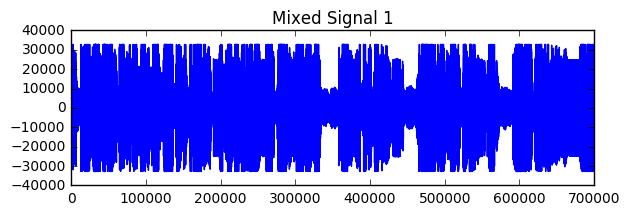

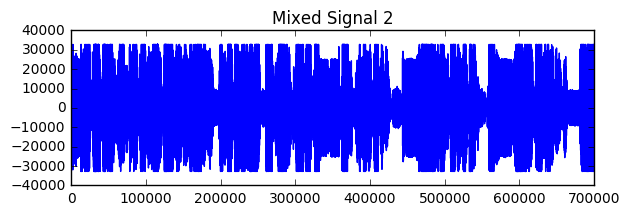

In [44]:



S = (np.c_[s1, s2]).T


A = np.array([[.75, 0.25],
              [0.25, .75]]) 
print 'Mixing Matrix:'
print A.round(2)

# Mix Signals
X = np.dot(A,S)

# Mixed Signal i
for i in range(X.shape[0]):
    pl.figure(figsize=(6.75,2))
    pl.plot((X[i]).astype(np.int16))
    pl.title('Mixed Signal %d' % (i+1))
    pl.show()
    wavPlayer((X[i]).astype(np.int16), fs)

In [45]:
from shogun.Features  import RealFeatures

mixed_signals = RealFeatures((X).astype(np.float64))

In [46]:
from shogun.Converter import Jade

# Separating with JADE
jade = Jade()
signals = jade.apply(mixed_signals)

S_ = signals.get_feature_matrix()

A_ = jade.get_mixing_matrix()
A_ = A_ / A_.sum(axis=0)
print 'Estimated Mixing Matrix:'
print A_


Estimated Mixing Matrix:
[[ 0.24975521  0.75051015]
 [ 0.75024479  0.24948985]]


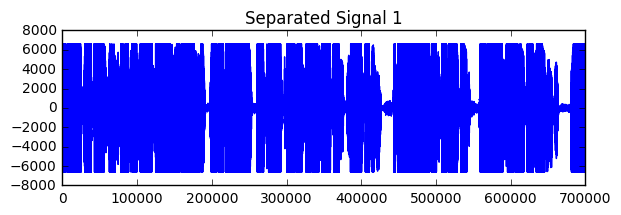

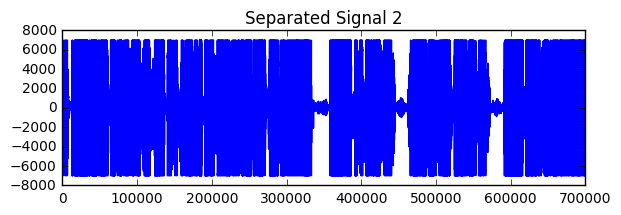

In [47]:
gain = 4000
for i in range(S_.shape[0]):
    pl.figure(figsize=(6.75,2))
    pl.plot((gain*S_[i]).astype(np.int16))
    pl.title('Separated Signal %d' % (i+1))
    pl.show()
    wavPlayer((gain*S_[i]).astype(np.int16), fs)